In [3]:
import os
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt 
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import torch.nn.functional as F
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np
import warnings
warnings.filterwarnings('ignore')

## Ví dụ 1.

In [3]:
!curl -L -o cats_and_dogs_filtered.zip https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
!tar -xf cats_and_dogs_filtered.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0 65.4M    0 49294    0     0  56442      0  0:20:15 --:--:--  0:20:15 56724
  2 65.4M    2 1758k    0     0   962k      0  0:01:09  0:00:01  0:01:08  964k
  6 65.4M    6 4592k    0     0  1623k      0  0:00:41  0:00:02  0:00:39 1626k
 10 65.4M   10 7344k    0     0  1910k      0  0:00:35  0:00:03  0:00:32 1912k
 15 65.4M   15 10.3M    0     0  2190k      0  0:00:30  0:00:04  0:00:26 2192k
 21 65.4M   21 13.8M    0     0  2434k      0  0:00:27  0:00:05  0:00:22 2853k
 24 65.4M   24 16.1M    0     0  2410k      0  0:00:27  0:00:06  0:00:21 2937k
 28 65.4M   28 18.8M    0     0  2463k      0  0:00:27  0:00:07  0:00:20 2939k
 31 65.4M   31 20.4M    0     0  2373k      0  0:00:28  0:00:08  0:00:20 2730k
 34 65.4M   34 22.7M    0     0  2365k      0  0:00

In [2]:
base_dir = 'cats_and_dogs_filtered' 
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'validation')
# Change the base_dir to where you put dataset 
print("Contents of base directory:") 
print(os.listdir(base_dir)) 
 
print("\nContents of train directory:") 
print(os.listdir(train_dir)) 
 
print("\nContents of validation directory:") 
print(os.listdir(val_dir))

Contents of base directory:
['train', 'validation', 'vectorize.py']

Contents of train directory:
['cats', 'dogs']

Contents of validation directory:
['cats', 'dogs']


In [3]:
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
val_cats_dir = os.path.join(val_dir, 'cats')
val_dogs_dir = os.path.join(val_dir, 'dogs')

train_cat_fnames = os.listdir(train_cats_dir) 
train_dog_fnames = os.listdir(train_dogs_dir) 
 
print(train_cat_fnames[:10]) 
print(train_dog_fnames[:10]) 
 
print('total training cat images :', len(os.listdir(train_cats_dir))) 
print('total training dog images :', len(os.listdir(train_dogs_dir))) 
 
print('total validation cat images :', len(os.listdir(val_cats_dir))) 
print('total validation dog images :', len(os.listdir(val_dogs_dir)))

['cat.0.jpg', 'cat.1.jpg', 'cat.10.jpg', 'cat.100.jpg', 'cat.101.jpg', 'cat.102.jpg', 'cat.103.jpg', 'cat.104.jpg', 'cat.105.jpg', 'cat.106.jpg']
['dog.0.jpg', 'dog.1.jpg', 'dog.10.jpg', 'dog.100.jpg', 'dog.101.jpg', 'dog.102.jpg', 'dog.103.jpg', 'dog.104.jpg', 'dog.105.jpg', 'dog.106.jpg']
total training cat images : 1000
total training dog images : 1000
total validation cat images : 500
total validation dog images : 500


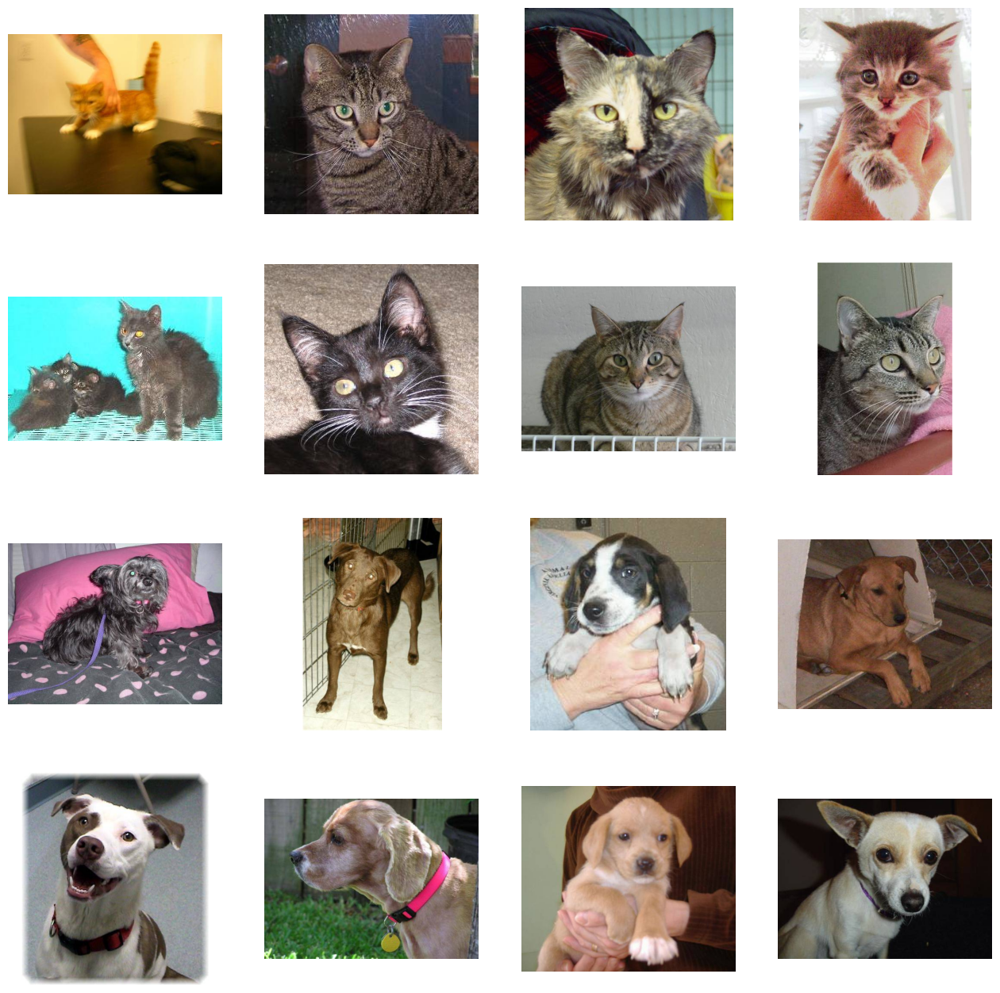

In [4]:
# Parameters for our graph; we'll output images in a 4x4 configuration 
nrows = 4 
ncols = 4 
 
pic_index = 0 # Index for iterating over images 
# Set up matplotlib fig, and size it to fit 4x4 pics 
fig = plt.gcf() 
fig.set_size_inches(ncols*4, nrows*4) 
  
pic_index+=8 
 
next_cat_pix = [os.path.join(train_cats_dir, fname)  
                for fname in train_cat_fnames[ pic_index-8:pic_index]  
               ] 
 
next_dog_pix = [os.path.join(train_dogs_dir, fname)  
                for fname in train_dog_fnames[ pic_index-8:pic_index] 
               ] 
 
for i, img_path in enumerate(next_cat_pix+next_dog_pix): 
  sp = plt.subplot(nrows, ncols, i + 1) 
  sp.axis('off') # Don't show axes (or gridlines) 
 
  img = mpimg.imread(img_path) 
  plt.imshow(img) 
 
plt.show()

Dataset:

In [6]:
class CatnDogDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        if transform is None:
            self.transform = transforms.ToTensor()
        else:
            self.transform = transform

        self.images, self.labels = self._get_images_and_labels(self.img_dir) 

    def _get_images_and_labels(self, img_dir):
        cat_imgs_dir = os.path.join(img_dir, 'cats')
        dog_imgs_dir = os.path.join(img_dir, 'dogs')
        

        imgs, labels = [], []
        for img in os.listdir(cat_imgs_dir):
            img_path = os.path.join(cat_imgs_dir, img)
            imgs.append(Image.open(img_path).convert('RGB'))
            labels.append(0)
        for img in os.listdir(dog_imgs_dir):
            img_path = os.path.join(dog_imgs_dir, img)
            imgs.append(Image.open(img_path).convert('RGB'))
            labels.append(1)

        return imgs, torch.tensor(labels, dtype=torch.float32)
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx): 
        img = self.images[idx]
        label = self.labels[idx]

        img = self.transform(img)

        return img, label
    
# test
test = CatnDogDataset(train_dir)
print(len(test))

2000


Model:

In [41]:
class CatnDogClassifier(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3)
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3)
        self.max_pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.flatten = torch.nn.Flatten()

        self.fc = torch.nn.Linear(in_features=18496, out_features=1)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool(x)
        x = F.relu(self.conv3(x))
        x = self.max_pool(x)
        x = self.fc(self.flatten(x))

        return x

# test
model = CatnDogClassifier()
model(torch.randn(1, 3, 150, 150, dtype=torch.float32))

tensor([[0.1015]], grad_fn=<AddmmBackward0>)

Train model:

In [57]:
# hyper-parameter
batch_size = 20
learning_rate = 0.001
momentum = 0.9
num_epochs = 20

In [43]:
# prepare data
data_transform = transforms.Compose([
    transforms.Resize((150,150)),
    transforms.ToTensor()
])

train_set = CatnDogDataset(train_dir, transform=data_transform)
val_set = CatnDogDataset(val_dir, transform=data_transform)

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)

In [64]:
# prepare model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CatnDogClassifier()
model.to(device)

criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=momentum)

In [65]:
# training loops
for epoch in range(num_epochs):
    train_loops = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}:')
    epoch_loss = 0.0
    model.train()
    for images, labels in train_loops:
        images = images.to(device)
        labels = labels.to(device).reshape((-1,1))

        optimizer.zero_grad()
        logits = model(images)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        train_loops.set_postfix({'train_loss': loss.item()})
        epoch_loss += loss.item()
    epoch_loss /= len(train_loader)
    train_loops.set_postfix({'epoch_loss': epoch_loss})
    # eval
    with torch.no_grad():
        model.eval()
        val_loss = 0.0
        val_loops = tqdm(val_loader, desc=f'Validating epoch {epoch+1}/{num_epochs}:')
        correct, total = 0, 0
        for images, labels in val_loops:
            images = images.to(device)
            labels = labels.to(device).reshape((-1,1))

            logits = model(images)
            loss = criterion(logits, labels)
            val_loss += loss.item()
            predicted = torch.zeros_like(labels)
            predicted[torch.sigmoid(logits) > 0.5] = 1
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        val_loss /= len(val_loader)
        accuracy = 100 * correct / total
        print(f'Validation loss: {val_loss}, val_accuracy: {accuracy:.2f}%')


Validating epoch 1/20:: 100%|██████████| 50/50 [00:02<00:00, 23.08it/s]


Validation loss: 0.6911777317523956, val_accuracy: 58.60%


Validating epoch 2/20:: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]


Validation loss: 0.6897642374038696, val_accuracy: 50.10%


Validating epoch 3/20:: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]


Validation loss: 0.6883835983276367, val_accuracy: 53.30%


Validating epoch 4/20:: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]


Validation loss: 0.6846820986270905, val_accuracy: 55.50%


Validating epoch 5/20:: 100%|██████████| 50/50 [00:02<00:00, 22.30it/s]


Validation loss: 0.6888551151752472, val_accuracy: 51.10%


Validating epoch 6/20:: 100%|██████████| 50/50 [00:02<00:00, 22.99it/s]


Validation loss: 0.6865717458724976, val_accuracy: 50.50%


Validating epoch 7/20:: 100%|██████████| 50/50 [00:02<00:00, 22.45it/s]


Validation loss: 0.6767255353927613, val_accuracy: 59.20%


Validating epoch 8/20:: 100%|██████████| 50/50 [00:02<00:00, 23.69it/s]


Validation loss: 0.6771320390701294, val_accuracy: 59.30%


Validating epoch 9/20:: 100%|██████████| 50/50 [00:02<00:00, 22.44it/s]


Validation loss: 0.6708141887187957, val_accuracy: 60.20%


Validating epoch 10/20:: 100%|██████████| 50/50 [00:02<00:00, 22.69it/s]


Validation loss: 0.6660581648349762, val_accuracy: 60.10%


Validating epoch 11/20:: 100%|██████████| 50/50 [00:02<00:00, 21.49it/s]


Validation loss: 0.6607044446468353, val_accuracy: 60.70%


Validating epoch 12/20:: 100%|██████████| 50/50 [00:02<00:00, 22.45it/s]


Validation loss: 0.6631005096435547, val_accuracy: 59.20%


Validating epoch 13/20:: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]


Validation loss: 0.6565237069129943, val_accuracy: 63.30%


Validating epoch 14/20:: 100%|██████████| 50/50 [00:02<00:00, 22.71it/s]


Validation loss: 0.653479288816452, val_accuracy: 61.80%


Validating epoch 15/20:: 100%|██████████| 50/50 [00:02<00:00, 21.61it/s]


Validation loss: 0.6581150376796723, val_accuracy: 60.10%


Validating epoch 16/20:: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]


Validation loss: 0.6432976216077805, val_accuracy: 61.50%


Validating epoch 17/20:: 100%|██████████| 50/50 [00:02<00:00, 22.57it/s]


Validation loss: 0.6303315532207489, val_accuracy: 64.50%


Validating epoch 18/20:: 100%|██████████| 50/50 [00:02<00:00, 22.78it/s]


Validation loss: 0.6231806099414825, val_accuracy: 64.80%


Validating epoch 19/20:: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]


Validation loss: 0.618357025384903, val_accuracy: 63.90%


Validating epoch 20/20:: 100%|██████████| 50/50 [00:02<00:00, 20.91it/s]

Validation loss: 0.6066874575614929, val_accuracy: 66.20%


- Nhìn chung, mô hình quá trình học của mô hình diễn ra khá tốt do accuracy cải thiện dần theo thời gian (epoch cuối cho accuracy cao nhất)
- Training loss có xu hướng giảm nhưng có nhiều biến động nhưng không quá nhiều, điều này là do ta sử dụng optimizer là SGD với batch_size ở mức vừa phải

Visualize feature map:

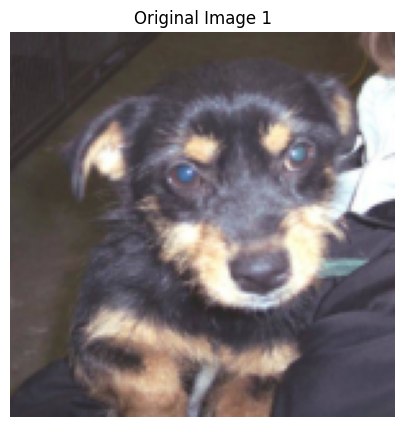

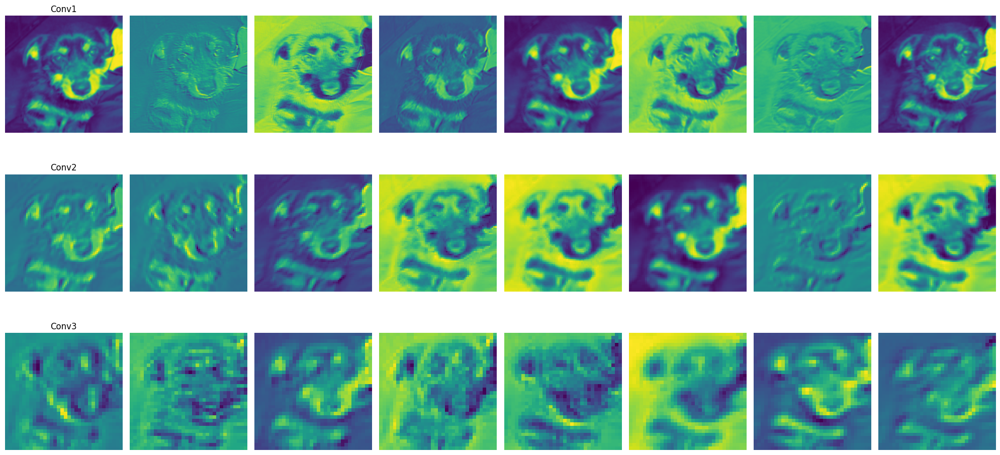

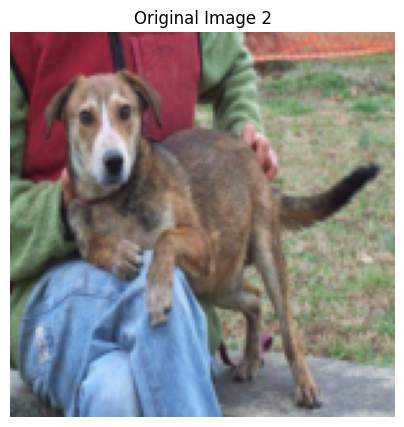

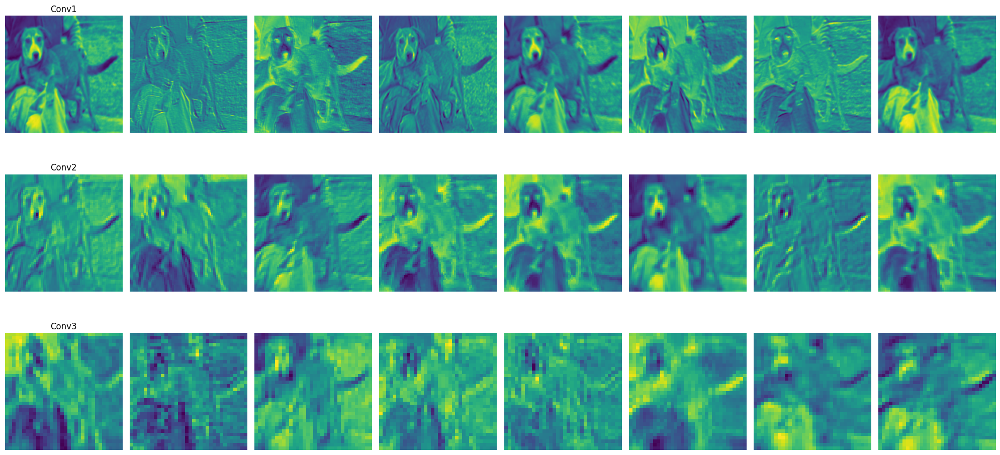

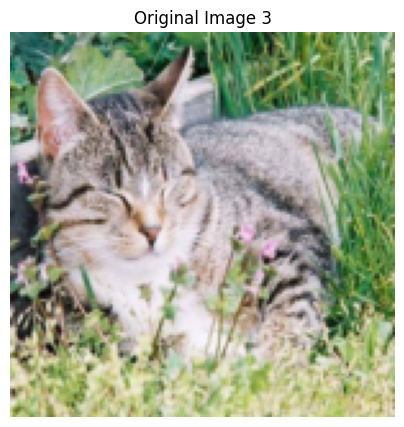

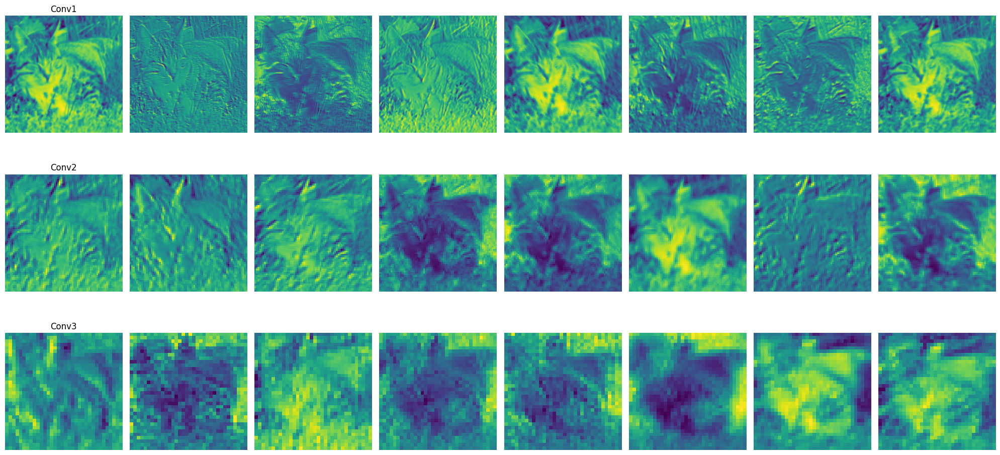

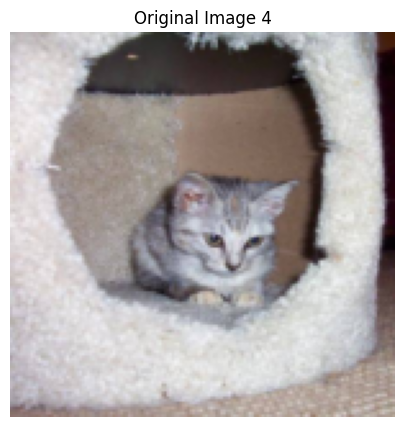

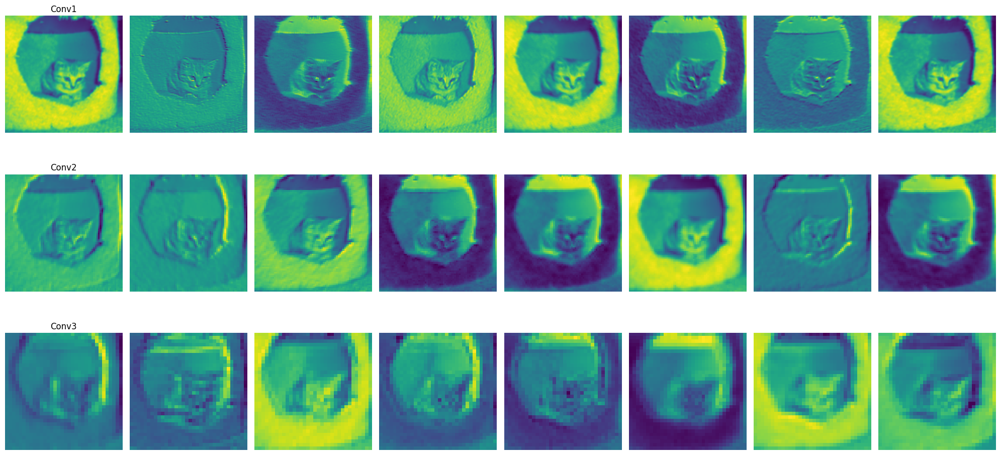

In [68]:
def get_feature_maps(model, image):
    feature_maps = []
    
    def hook_fn(module, input, output):
        feature_maps.append(output)
    
    hooks = []
    for layer in [model.conv1, model.conv2, model.conv3]:
        hooks.append(layer.register_forward_hook(hook_fn))
    
    with torch.no_grad():
        model.eval()
        _ = model(image)
    
    for hook in hooks:
        hook.remove()
        
    return feature_maps

def plot_feature_maps(feature_maps, num_features=8):
    fig = plt.figure(figsize=(20, 10))
    for i, fmap in enumerate(feature_maps):
        fmap = fmap[0].cpu().numpy()
        
        num_channels = min(num_features, fmap.shape[0])
        for j in range(num_channels):
            plt.subplot(len(feature_maps), num_features, i*num_features + j + 1)
            plt.imshow(fmap[j], cmap='viridis')
            plt.axis('off')
            if j == 0:
                plt.title(f'Conv{i+1}')
    plt.tight_layout()
    plt.show()

random_indices = torch.randint(0, len(val_set), (4,))
images = []
for idx in random_indices:
    img, _ = val_set[idx]
    images.append(img.unsqueeze(0))  # Thêm batch dimension

for i, image in enumerate(images):
    image = image.to(device)
    
    plt.figure(figsize=(5,5))
    plt.imshow(image[0].cpu().permute(1,2,0))
    plt.title(f'Original Image {i+1}')
    plt.axis('off')
    plt.show()
    
    feature_maps = get_feature_maps(model, image)
    plot_feature_maps(feature_maps)

#### Adding dropout:

In [75]:
class CatnDogClassifier(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3)
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3)
        self.max_pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.flatten = torch.nn.Flatten()
        
        self.dropout1 = torch.nn.Dropout(p=0.25)  
        self.dropout2 = torch.nn.Dropout(p=0.5)   
        
        self.fc = torch.nn.Linear(in_features=18496, out_features=1)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool(x)
        x = self.dropout1(x)
        
        x = F.relu(self.conv2(x))
        x = self.max_pool(x)
        x = self.dropout1(x)
        
        x = F.relu(self.conv3(x))
        x = self.max_pool(x)
        x = self.dropout1(x)
        
        x = self.flatten(x)
        x = self.dropout2(x)
        x = self.fc(x)

        return x

In [76]:
# prepare model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CatnDogClassifier()
model.to(device)

criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=momentum)

In [77]:
# training loops
for epoch in range(num_epochs):
    train_loops = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}:')
    epoch_loss = 0.0
    model.train()
    for images, labels in train_loops:
        images = images.to(device)
        labels = labels.to(device).reshape((-1,1))

        optimizer.zero_grad()
        logits = model(images)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        train_loops.set_postfix({'train_loss': loss.item()})
        epoch_loss += loss.item()
    epoch_loss /= len(train_loader)
    train_loops.set_postfix({'epoch_loss': epoch_loss})
    # eval
    with torch.no_grad():
        model.eval()
        val_loss = 0.0
        val_loops = tqdm(val_loader, desc=f'Validating epoch {epoch+1}/{num_epochs}:')
        correct, total = 0, 0
        for images, labels in val_loops:
            images = images.to(device)
            labels = labels.to(device).reshape((-1,1))

            logits = model(images)
            loss = criterion(logits, labels)
            val_loss += loss.item()
            predicted = torch.zeros_like(labels)
            predicted[torch.sigmoid(logits) > 0.5] = 1
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        val_loss /= len(val_loader)
        accuracy = 100 * correct / total
        print(f'Validation loss: {val_loss}, val_accuracy: {accuracy:.2f}%')


Validating epoch 1/20:: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]


Validation loss: 0.6932745718955994, val_accuracy: 50.00%


Validating epoch 2/20:: 100%|██████████| 50/50 [00:02<00:00, 21.57it/s]


Validation loss: 0.6929751932621002, val_accuracy: 50.00%


Validating epoch 3/20:: 100%|██████████| 50/50 [00:02<00:00, 22.03it/s]


Validation loss: 0.6929552948474884, val_accuracy: 50.00%


Validating epoch 4/20:: 100%|██████████| 50/50 [00:02<00:00, 21.97it/s]


Validation loss: 0.6926427268981934, val_accuracy: 51.60%


Validating epoch 5/20:: 100%|██████████| 50/50 [00:02<00:00, 21.60it/s]


Validation loss: 0.6924980306625366, val_accuracy: 49.80%


Validating epoch 6/20:: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]


Validation loss: 0.6946516954898834, val_accuracy: 50.00%


Validating epoch 7/20:: 100%|██████████| 50/50 [00:02<00:00, 20.56it/s]


Validation loss: 0.6924610936641693, val_accuracy: 50.00%


Validating epoch 8/20:: 100%|██████████| 50/50 [00:02<00:00, 22.27it/s]


Validation loss: 0.6913529372215271, val_accuracy: 56.00%


Validating epoch 9/20:: 100%|██████████| 50/50 [00:02<00:00, 22.17it/s]


Validation loss: 0.6906968522071838, val_accuracy: 59.80%


Validating epoch 10/20:: 100%|██████████| 50/50 [00:02<00:00, 20.79it/s]


Validation loss: 0.690000182390213, val_accuracy: 57.80%


Validating epoch 11/20:: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]


Validation loss: 0.6887083113193512, val_accuracy: 59.60%


Validating epoch 12/20:: 100%|██████████| 50/50 [00:02<00:00, 22.32it/s]


Validation loss: 0.6875091767311097, val_accuracy: 59.00%


Validating epoch 13/20:: 100%|██████████| 50/50 [00:02<00:00, 22.33it/s]


Validation loss: 0.6879838013648987, val_accuracy: 51.40%


Validating epoch 14/20:: 100%|██████████| 50/50 [00:02<00:00, 23.28it/s]


Validation loss: 0.6851965713500977, val_accuracy: 52.80%


Validating epoch 15/20:: 100%|██████████| 50/50 [00:02<00:00, 23.04it/s]


Validation loss: 0.6817998254299164, val_accuracy: 60.40%


Validating epoch 16/20:: 100%|██████████| 50/50 [00:02<00:00, 22.74it/s]


Validation loss: 0.6802648603916168, val_accuracy: 60.70%


Validating epoch 17/20:: 100%|██████████| 50/50 [00:02<00:00, 24.22it/s]


Validation loss: 0.6796538424491883, val_accuracy: 54.70%


Validating epoch 18/20:: 100%|██████████| 50/50 [00:02<00:00, 24.36it/s]


Validation loss: 0.6750685811042786, val_accuracy: 58.70%


Validating epoch 19/20:: 100%|██████████| 50/50 [00:02<00:00, 21.74it/s]


Validation loss: 0.6738672530651093, val_accuracy: 60.60%


Validating epoch 20/20:: 100%|██████████| 50/50 [00:02<00:00, 21.13it/s]

Validation loss: 0.6706952047348023, val_accuracy: 61.30%


- Dropout tuy giúp mô hình tổng quát hoá tốt hơn nhưng lại khiến quá trình hội tụ chậm đi

#### Using logistic regression:

In [78]:
import os
import numpy as np
from PIL import Image
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import torchvision.transforms as transforms

data_transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor()
])

def load_and_preprocess_data(data_dir):
    images = []
    labels = []
    
    cat_dir = os.path.join(data_dir, 'cats')
    for img_name in os.listdir(cat_dir):
        img_path = os.path.join(cat_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        img_tensor = data_transform(img)
        img_flat = img_tensor.numpy().flatten()
        images.append(img_flat)
        labels.append(0)
    
    dog_dir = os.path.join(data_dir, 'dogs')
    for img_name in os.listdir(dog_dir):
        img_path = os.path.join(dog_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        img_tensor = data_transform(img)
        img_flat = img_tensor.numpy().flatten()
        images.append(img_flat)
        labels.append(1)
        
    return np.array(images), np.array(labels)

train_dir = 'cats_and_dogs_filtered/train'
val_dir = 'cats_and_dogs_filtered/validation'

X_train, y_train = load_and_preprocess_data(train_dir)
X_val, y_val = load_and_preprocess_data(val_dir)

print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)

# Train logistic regression
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Evaluate
train_pred = model.predict(X_train)
val_pred = model.predict(X_val)

print("\nResults:")
print(f"Training accuracy: {accuracy_score(y_train, train_pred):.4f}")
print(f"Validation accuracy: {accuracy_score(y_val, val_pred):.4f}")

Training data shape: (2000, 67500)
Validation data shape: (1000, 67500)

Results:
Training accuracy: 1.0000
Validation accuracy: 0.5680


- Logistic Regression là mô hình tuyến tính đơn giản, nên accuracy có thể không cao bằng CNN
- Việc flatten ảnh làm mất đi thông tin về cấu trúc không gian của ảnh
- Số features rất lớn (67500) nên training có thể mất nhiều thời gian

#### Using PCA:

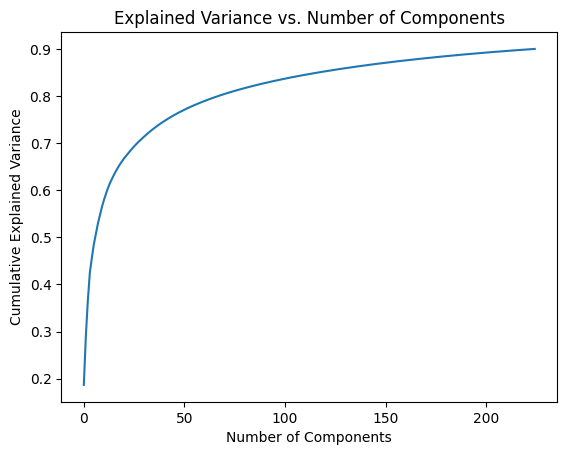

Original shape: (2000, 67500)
After PCA: (2000, 225)
Total explained variance ratio: 0.9005

Logistic Regression Results:
Training accuracy: 0.6970
Validation accuracy: 0.5860

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.61      0.60       500
           1       0.59      0.56      0.58       500

    accuracy                           0.59      1000
   macro avg       0.59      0.59      0.59      1000
weighted avg       0.59      0.59      0.59      1000


MLP Results:
Training accuracy: 0.9585
Validation accuracy: 0.5680

Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.62      0.59       500
           1       0.58      0.52      0.55       500

    accuracy                           0.57      1000
   macro avg       0.57      0.57      0.57      1000
weighted avg       0.57      0.57      0.57      1000



In [79]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

n_components = 225
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_scaled)
X_val_pca = pca.transform(X_val_scaled)

# Visualize explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.show()

print(f"Original shape: {X_train.shape}")
print(f"After PCA: {X_train_pca.shape}")
print(f"Total explained variance ratio: {np.sum(pca.explained_variance_ratio_):.4f}")

# logistic Regression
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train_pca, y_train)

# evaluate Logistic Regression
lr_train_pred = lr_model.predict(X_train_pca)
lr_val_pred = lr_model.predict(X_val_pca)

print("\nLogistic Regression Results:")
print(f"Training accuracy: {accuracy_score(y_train, lr_train_pred):.4f}")
print(f"Validation accuracy: {accuracy_score(y_val, lr_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_val, lr_val_pred))

# multi-layer Perceptron
mlp_model = MLPClassifier(
    hidden_layer_sizes=(128, 64),  # 2 hidden layers
    activation='relu',
    solver='adam',
    max_iter=1000,
    random_state=42,
    early_stopping=True,
    validation_fraction=0.1
)

mlp_model.fit(X_train_pca, y_train)

# Evaluate MLP
mlp_train_pred = mlp_model.predict(X_train_pca)
mlp_val_pred = mlp_model.predict(X_val_pca)

print("\nMLP Results:")
print(f"Training accuracy: {accuracy_score(y_train, mlp_train_pred):.4f}")
print(f"Validation accuracy: {accuracy_score(y_val, mlp_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(y_val, mlp_val_pred))

- MLP gặp tình trạng overfit tương đối mạnh do có cấu trúc phức tạp

## 2. Ví dụ 2

Dataset:

In [81]:
class AnimalDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        if transform is None:
            self.transform = transforms.ToTensor()
        else:
            self.transform = transform

        self.images, self.labels = self._get_images_and_labels(self.img_dir)

    def _get_images_and_labels(self, img_dir):
        cat_imgs_dir = os.path.join(img_dir, 'cats')
        dog_imgs_dir = os.path.join(img_dir, 'dogs')
        panda_imgs_dir = os.path.join(img_dir, 'pandas')
        
        imgs, labels = [], []
        # Cats - label 0
        for img in os.listdir(cat_imgs_dir):
            img_path = os.path.join(cat_imgs_dir, img)
            imgs.append(Image.open(img_path).convert('RGB'))
            labels.append(0)
        # Dogs - label 1    
        for img in os.listdir(dog_imgs_dir):
            img_path = os.path.join(dog_imgs_dir, img)
            imgs.append(Image.open(img_path).convert('RGB'))
            labels.append(1)
        # Pandas - label 2
        for img in os.listdir(panda_imgs_dir):
            img_path = os.path.join(panda_imgs_dir, img)
            imgs.append(Image.open(img_path).convert('RGB'))
            labels.append(2)

        return imgs, torch.tensor(labels, dtype=torch.long) # Change to long for CrossEntropyLoss

    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img = self.images[idx]
        label = self.labels[idx]
        img = self.transform(img)
        return img, label

In [84]:
import os
import shutil
from sklearn.model_selection import train_test_split

def create_train_val_dirs(base_path, val_split=0.2):
    train_dir = os.path.join(base_path, 'train')
    val_dir = os.path.join(base_path, 'validation')
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    
    classes = ['cats', 'dogs', 'panda']
    
    for cls in classes:
        os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
        os.makedirs(os.path.join(val_dir, cls), exist_ok=True)
        
        src_dir = os.path.join(base_path, cls)
        files = os.listdir(src_dir)
        
        # train/validation split
        train_files, val_files = train_test_split(files, test_size=val_split, random_state=42)
        
        for f in train_files:
            src = os.path.join(src_dir, f)
            dst = os.path.join(train_dir, cls, f)
            shutil.copy2(src, dst)
            
        for f in val_files:
            src = os.path.join(src_dir, f)
            dst = os.path.join(val_dir, cls, f)
            shutil.copy2(src, dst)
        
        print(f'{cls}:')
        print(f'Total images: {len(files)}')
        print(f'Training images: {len(train_files)}')
        print(f'Validation images: {len(val_files)}\n')

base_path = r'C:\Users\admin\Downloads\animals\animals'
create_train_val_dirs(base_path)

train_dir = os.path.join(base_path, 'train')
val_dir = os.path.join(base_path, 'validation')

# data transforms
train_transform = transforms.Compose([
    transforms.Resize((150,150)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((150,150)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])

# create datasets
train_set = AnimalDataset(train_dir, transform=train_transform)
val_set = AnimalDataset(val_dir, transform=val_transform)

# create dataloaders
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=False)

print("Train set size:", len(train_set))
print("Validation set size:", len(val_set))

cats:
Total images: 1000
Training images: 800
Validation images: 200

dogs:
Total images: 1000
Training images: 800
Validation images: 200

panda:
Total images: 1000
Training images: 800
Validation images: 200

Train set size: 1600
Validation set size: 400


Model architecture:

In [85]:
class AnimalClassifier(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3)
        self.max_pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = torch.nn.Dropout(p=0.15)
        
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3)
        self.dropout2 = torch.nn.Dropout(p=0.1)
        
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.dropout3 = torch.nn.Dropout(p=0.1)
        
        self.flatten = torch.nn.Flatten()
        
        self._to_linear = None
        self._get_conv_output_size((3, 150, 150))
        
        # fc
        self.fc1 = torch.nn.Linear(self._to_linear, 512)
        self.fc2 = torch.nn.Linear(512, 3)  # 3 output classes
        
    def _get_conv_output_size(self, shape):
        batch_size = 1
        input = torch.autograd.Variable(torch.rand(batch_size, *shape))
        output = self._forward_conv(input)
        self._to_linear = int(np.prod(output.size()[1:]))
        
    def _forward_conv(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool(x)
        x = self.dropout1(x)
        
        x = F.relu(self.conv2(x))
        x = self.max_pool(x)
        x = self.dropout2(x)
        
        x = F.relu(self.conv3(x))
        x = self.max_pool(x)
        x = self.dropout3(x)
        return x
        
    def forward(self, x):
        x = self._forward_conv(x)
        
        x = self.flatten(x)
        
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        x = F.softmax(x, dim=1)  # softmax for multi-class classification
        
        return x

# optimizer
def setup_model(learning_rate=0.001):
    model = AnimalClassifier()
    criterion = torch.nn.CrossEntropyLoss()  # Categorical cross entropy loss
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    
    return model, criterion, optimizer


In [87]:
model, criterion, optimizer = setup_model()
model = model.to(device)

num_epochs = 30
best_val_acc = 0.0

for epoch in range(num_epochs):
    # Training
    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    train_loop = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for images, labels in train_loop:
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()
        train_loss += loss.item()
        
        train_loop.set_postfix({'train_loss': loss.item(), 
                              'train_acc': 100 * train_correct / train_total})
    
    # Validation
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    class_correct = [0] * 3
    class_total = [0] * 3
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc='Validation'):
            images = images.to(device)
            labels = labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += (predicted[i] == label).item()
                class_total[label] += 1
    
    val_acc = 100 * val_correct / val_total
    print(f'\nEpoch {epoch+1}')
    print(f'Training Loss: {train_loss/len(train_loader):.4f}')
    print(f'Validation Loss: {val_loss/len(val_loader):.4f}')
    print(f'Validation Accuracy: {val_acc:.2f}%')


Validation: 100%|██████████| 13/13 [00:01<00:00,  9.01it/s]



Epoch 1
Training Loss: 1.0542
Validation Loss: 1.0706
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 10.60it/s]



Epoch 2
Training Loss: 1.0514
Validation Loss: 1.0706
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.03it/s]



Epoch 3
Training Loss: 1.0514
Validation Loss: 1.0706
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.19it/s]



Epoch 4
Training Loss: 1.0514
Validation Loss: 1.0706
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.56it/s]



Epoch 5
Training Loss: 1.0514
Validation Loss: 1.0705
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.28it/s]



Epoch 6
Training Loss: 1.0514
Validation Loss: 1.0705
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.69it/s]



Epoch 7
Training Loss: 0.9941
Validation Loss: 1.0004
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.97it/s]



Epoch 8
Training Loss: 0.9519
Validation Loss: 0.9681
Validation Accuracy: 50.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.81it/s]



Epoch 9
Training Loss: 0.9267
Validation Loss: 0.9377
Validation Accuracy: 58.25%


Validation: 100%|██████████| 13/13 [00:01<00:00, 10.98it/s]



Epoch 10
Training Loss: 0.9084
Validation Loss: 0.9347
Validation Accuracy: 57.50%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.24it/s]



Epoch 11
Training Loss: 0.8899
Validation Loss: 0.8935
Validation Accuracy: 63.75%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.46it/s]



Epoch 12
Training Loss: 0.8642
Validation Loss: 0.8970
Validation Accuracy: 66.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.35it/s]



Epoch 13
Training Loss: 0.8324
Validation Loss: 0.8877
Validation Accuracy: 64.25%


Validation: 100%|██████████| 13/13 [00:00<00:00, 13.08it/s]



Epoch 14
Training Loss: 0.8184
Validation Loss: 0.8969
Validation Accuracy: 63.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.66it/s]



Epoch 15
Training Loss: 0.7954
Validation Loss: 0.8808
Validation Accuracy: 64.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.85it/s]



Epoch 16
Training Loss: 0.7905
Validation Loss: 0.9045
Validation Accuracy: 63.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.70it/s]



Epoch 17
Training Loss: 0.8022
Validation Loss: 0.8750
Validation Accuracy: 66.25%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.66it/s]



Epoch 18
Training Loss: 0.7763
Validation Loss: 0.9050
Validation Accuracy: 62.50%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.79it/s]



Epoch 19
Training Loss: 0.7677
Validation Loss: 0.8834
Validation Accuracy: 65.75%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.14it/s]



Epoch 20
Training Loss: 0.7504
Validation Loss: 0.8746
Validation Accuracy: 65.50%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.17it/s]



Epoch 21
Training Loss: 0.7379
Validation Loss: 0.8797
Validation Accuracy: 65.25%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.34it/s]



Epoch 22
Training Loss: 0.7355
Validation Loss: 0.8650
Validation Accuracy: 67.25%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.19it/s]



Epoch 23
Training Loss: 0.7266
Validation Loss: 0.8780
Validation Accuracy: 64.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 10.53it/s]



Epoch 24
Training Loss: 0.7224
Validation Loss: 0.8681
Validation Accuracy: 66.75%


Validation: 100%|██████████| 13/13 [00:01<00:00, 12.17it/s]



Epoch 25
Training Loss: 0.7175
Validation Loss: 0.8643
Validation Accuracy: 66.75%


Validation: 100%|██████████| 13/13 [00:01<00:00,  9.72it/s]



Epoch 26
Training Loss: 0.7213
Validation Loss: 0.8649
Validation Accuracy: 66.50%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.36it/s]



Epoch 27
Training Loss: 0.6933
Validation Loss: 0.8694
Validation Accuracy: 68.00%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.08it/s]



Epoch 28
Training Loss: 0.6952
Validation Loss: 0.8565
Validation Accuracy: 68.50%


Validation: 100%|██████████| 13/13 [00:01<00:00, 10.13it/s]



Epoch 29
Training Loss: 0.6786
Validation Loss: 0.8540
Validation Accuracy: 68.75%


Validation: 100%|██████████| 13/13 [00:01<00:00, 11.88it/s]


Epoch 30
Training Loss: 0.6727
Validation Loss: 0.8512
Validation Accuracy: 68.50%


Softmax regression:

In [94]:
data_transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor()
])

def load_and_preprocess_data(data_dir):
    images = []
    labels = []
    
    # Load cats (label 0)
    cat_dir = os.path.join(data_dir, 'cats')
    for img_name in os.listdir(cat_dir):
        img_path = os.path.join(cat_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        img_tensor = data_transform(img)
        img_flat = img_tensor.numpy().flatten()
        images.append(img_flat)
        labels.append(0)
    
    # Load dogs (label 1)  
    dog_dir = os.path.join(data_dir, 'dogs')
    for img_name in os.listdir(dog_dir):
        img_path = os.path.join(dog_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        img_tensor = data_transform(img)
        img_flat = img_tensor.numpy().flatten()
        images.append(img_flat)
        labels.append(1)

    # Load pandas (label 2)
    panda_dir = os.path.join(data_dir, 'panda')
    for img_name in os.listdir(panda_dir):
        img_path = os.path.join(panda_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        img_tensor = data_transform(img)
        img_flat = img_tensor.numpy().flatten()
        images.append(img_flat)
        labels.append(2)
        
    return np.array(images), np.array(labels)

# Load data
base_path = r'C:\Users\admin\Downloads\animals\animals'
train_dir = os.path.join(base_path, 'train')
val_dir = os.path.join(base_path, 'validation')

X_train, y_train = load_and_preprocess_data(train_dir)
X_val, y_val = load_and_preprocess_data(val_dir)

print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)

Training data shape: (2400, 67500)
Validation data shape: (600, 67500)


In [96]:
# rrain multi-class logistic regression
model = LogisticRegression()
model.fit(X_train, y_train)

# Evaluate
train_pred = model.predict(X_train)
val_pred = model.predict(X_val)

print("\nResults:")
print("Training accuracy: {:.4f}".format(accuracy_score(y_train, train_pred)))
print("Validation accuracy: {:.4f}".format(accuracy_score(y_val, val_pred)))

# classification report
print("\nClassification Report:")
print(classification_report(y_val, val_pred, 
                          target_names=['Cat', 'Dog', 'Panda']))

c:\Users\admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Results:
Training accuracy: 0.9213
Validation accuracy: 0.5350

Classification Report:
              precision    recall  f1-score   support

         Cat       0.48      0.48      0.48       200
         Dog       0.45      0.50      0.47       200
       Panda       0.72      0.62      0.67       200

    accuracy                           0.54       600
   macro avg       0.55      0.54      0.54       600
weighted avg       0.55      0.54      0.54       600



ANN:

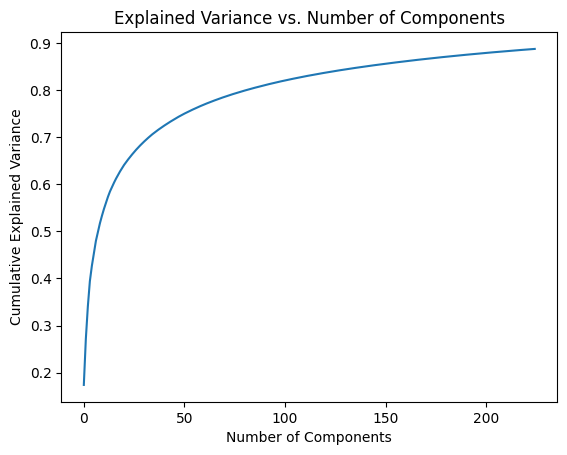

Original shape: (2400, 67500)
After PCA: (2400, 225)
Total explained variance ratio: 0.8873

MLP Results:
Training accuracy: 0.8779
Validation accuracy: 0.5333

MLP Classification Report:
              precision    recall  f1-score   support

         Cat       0.50      0.50      0.50       200
         Dog       0.44      0.44      0.44       200
       Panda       0.67      0.66      0.66       200

    accuracy                           0.53       600
   macro avg       0.53      0.53      0.53       600
weighted avg       0.53      0.53      0.53       600



In [97]:
# data normalization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# pca
n_components = 225
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_scaled)
X_val_pca = pca.transform(X_val_scaled)

# visualize explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.show()

print(f"Original shape: {X_train.shape}")
print(f"After PCA: {X_train_pca.shape}")
print(f"Total explained variance ratio: {np.sum(pca.explained_variance_ratio_):.4f}")

print("\nMLP Results:")
mlp_model = MLPClassifier(
    hidden_layer_sizes=(128, 64),
    activation='relu',
    solver='adam',
    max_iter=1000,
    random_state=42,
    early_stopping=True,
    validation_fraction=0.1
)

mlp_model.fit(X_train_pca, y_train)

# evaluate MLP
mlp_train_pred = mlp_model.predict(X_train_pca)
mlp_val_pred = mlp_model.predict(X_val_pca)

print("Training accuracy: {:.4f}".format(accuracy_score(y_train, mlp_train_pred)))
print("Validation accuracy: {:.4f}".format(accuracy_score(y_val, mlp_val_pred)))
print("\nMLP Classification Report:")
print(classification_report(y_val, mlp_val_pred, 
                          target_names=['Cat', 'Dog', 'Panda']))

- 1. Softmax Regression:
    - Mô hình đơn giản nhất
    - Có thể bị giới hạn do tính chất tuyến tính
    - Tốc độ training nhanh
- 2. MLP:
    - Phức tạp hơn Softmax
    - Có khả năng học các pattern phi tuyến
    - Dễ bị overfitting với hidden layers lớn
    - Training nhanh hơn CNN
- 3. CNN:
    - Phức tạp nhất trong 3 mô hình
    - Phù hợp nhất với dữ liệu ảnh do có thể học được spatial features
    - Training lâu nhất
    - Thường cho accuracy cao nhất

## 3. Ví dụ 3

Dataset:

Training samples: 132
Test samples: 33


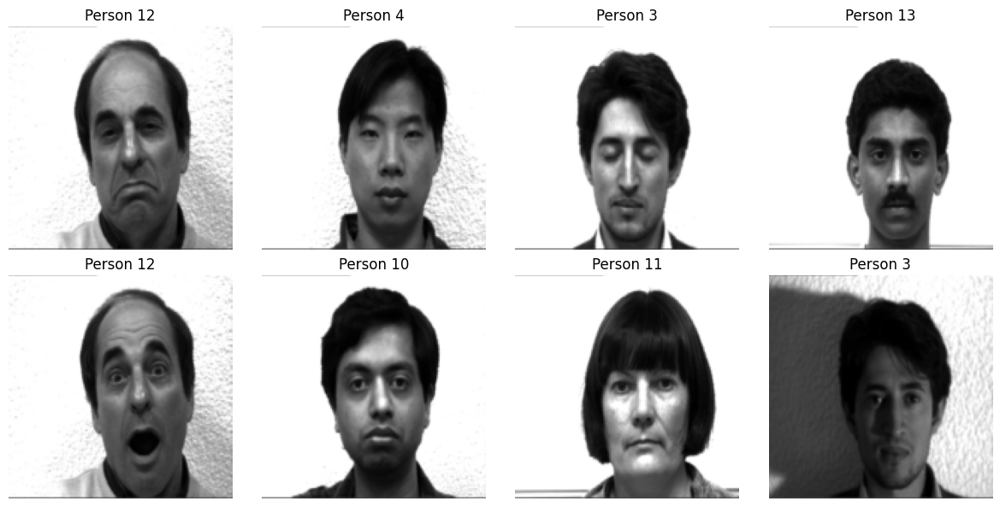

In [152]:
class YaleFacesDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((150, 150)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485], std=[0.229])
            ])
        else:
            self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        # Read as grayscale and convert to RGB
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

def load_yale_faces(base_path):
    image_paths = []
    labels = []
    
    for person_id in range(1, 16):  # 15 people
        for state in ['centerlight', 'glasses', 'happy', 'leftlight',
                     'noglasses', 'normal', 'rightlight', 'sad',
                     'sleepy', 'surprised', 'wink']:
            img_name = f'subject{str(person_id).zfill(2)}.{state}'
            img_path = os.path.join(base_path, img_name)
            
            if os.path.exists(img_path):
                image_paths.append(img_path)
                labels.append(person_id - 1)  # Labels from 0-14
    
    return np.array(image_paths), np.array(labels)

# load and split data
base_path = r'yalefaces\data'
image_paths, labels = load_yale_faces(base_path)

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    image_paths, labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

# data transformation
train_transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

test_transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

# create datasets
train_dataset = YaleFacesDataset(X_train, y_train, transform=train_transform)
test_dataset = YaleFacesDataset(X_test, y_test, transform=test_transform)

# create dataloaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

print(f"Training samples: {len(train_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# visualize some images
def show_images(dataloader):
    images, labels = next(iter(dataloader))
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.ravel()
    
    for idx in range(8):
        img = images[idx].permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min())  # Denormalize
        axes[idx].imshow(img)
        axes[idx].set_title(f'Person {labels[idx].item() + 1}')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

show_images(train_loader)

Model:

In [147]:
class FaceClassifier(torch.nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3)
        self.max_pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = torch.nn.Dropout(p=0.15)
        
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3)
        self.dropout2 = torch.nn.Dropout(p=0.1)
        
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.dropout3 = torch.nn.Dropout(p=0.1)
        
        self.flatten = torch.nn.Flatten()
        
        self._to_linear = None
        self._get_conv_output_size((3, 150, 150))
        
        self.fc1 = torch.nn.Linear(self._to_linear, 512)
        self.fc2 = torch.nn.Linear(512, num_classes)
        
    def _get_conv_output_size(self, shape):
        batch_size = 1
        input = torch.autograd.Variable(torch.rand(batch_size, *shape))
        output = self._forward_conv(input)
        self._to_linear = int(np.prod(output.size()[1:]))
        
    def _forward_conv(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool(x)
        x = self.dropout1(x)
        
        x = F.relu(self.conv2(x))
        x = self.max_pool(x)
        x = self.dropout2(x)
        
        x = F.relu(self.conv3(x))
        x = self.max_pool(x)
        x = self.dropout3(x)
        return x
        
    def forward(self, x):
        x = self._forward_conv(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [153]:
# setup model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_classes = len(np.unique(labels))
model = FaceClassifier(num_classes).to(device)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.002)

# training loop
num_epochs = 30

for epoch in range(num_epochs):
    # training phase
    model.train()
    train_loss = 0
    correct = 0
    total = 0
    
    train_loop = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for images, labels in train_loop:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        train_loop.set_postfix({
            'loss': train_loss/total,
            'acc': 100.*correct/total
        })
    
    # testing phase
    model.eval()
    test_loss = 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Testing'):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            test_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    predictions = np.array(predictions)
    true_labels = np.array(true_labels)

    # Calculate metrics with average=None to get per-class scores
    precision = precision_score(true_labels, predictions, average=None)
    recall = recall_score(true_labels, predictions, average=None)
    f1 = f1_score(true_labels, predictions, average=None)
    accuracy = accuracy_score(true_labels, predictions)

    # Calculate weighted averages for overall metrics
    weighted_precision = precision_score(true_labels, predictions, average='weighted')
    weighted_recall = recall_score(true_labels, predictions, average='weighted')
    weighted_f1 = f1_score(true_labels, predictions, average='weighted')

    # Print results
    print("\nOverall Results:")
    print(f"Test Accuracy: {accuracy*100:.2f}%")
    print(f"Weighted Precision: {weighted_precision*100:.2f}%")
    print(f"Weighted Recall: {weighted_recall*100:.2f}%")
    print(f"Weighted F1-score: {weighted_f1*100:.2f}%")

    print("\nPer-class Results:")
    print("-" * 60)
    print(f"{'Subject':<10} {'Precision':<12} {'Recall':<12} {'F1-score':<12}")
    print("-" * 60)

    for i in range(num_classes):
        print(f"{i+1:<10} {precision[i]*100:>8.2f}%  {recall[i]*100:>8.2f}%  {f1[i]*100:>8.2f}%")

    print("-" * 60)

    # Print detailed classification report
    print("\nDetailed Classification Report:")
    print(classification_report(true_labels, predictions, 
                            target_names=[f'Subject {i+1}' for i in range(num_classes)]))

Testing: 100%|██████████| 3/3 [00:00<00:00, 23.17it/s]



Overall Results:
Test Accuracy: 6.06%
Weighted Precision: 1.14%
Weighted Recall: 6.06%
Weighted F1-score: 1.91%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             12.50%     66.67%     21.05%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
--------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 29.22it/s]



Overall Results:
Test Accuracy: 9.09%
Weighted Precision: 0.88%
Weighted Recall: 9.09%
Weighted F1-score: 1.60%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              9.68%    100.00%     17.65%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
--------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.14it/s]



Overall Results:
Test Accuracy: 12.12%
Weighted Precision: 2.48%
Weighted Recall: 12.12%
Weighted F1-score: 3.92%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4             14.29%     33.33%     20.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             13.04%    100.00%     23.08%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 19.16it/s]



Overall Results:
Test Accuracy: 18.18%
Weighted Precision: 3.71%
Weighted Recall: 18.18%
Weighted F1-score: 6.12%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4             25.00%    100.00%     40.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             15.79%    100.00%     27.27%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 28.61it/s]



Overall Results:
Test Accuracy: 15.15%
Weighted Precision: 3.26%
Weighted Recall: 15.15%
Weighted F1-score: 5.21%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4             22.22%     66.67%     33.33%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             13.64%    100.00%     24.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 28.30it/s]



Overall Results:
Test Accuracy: 18.18%
Weighted Precision: 4.47%
Weighted Recall: 18.18%
Weighted F1-score: 7.02%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4             33.33%    100.00%     50.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             15.79%    100.00%     27.27%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
------------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.36it/s]



Overall Results:
Test Accuracy: 24.24%
Weighted Precision: 18.10%
Weighted Recall: 24.24%
Weighted F1-score: 16.62%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%     50.00%     66.67%
3              0.00%      0.00%      0.00%
4             33.33%     66.67%     44.44%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             15.79%    100.00%     27.27%
8             25.00%     50.00%     33.33%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12           100.00%     50.00%     66.67%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 29.49it/s]



Overall Results:
Test Accuracy: 27.27%
Weighted Precision: 13.64%
Weighted Recall: 27.27%
Weighted F1-score: 15.40%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4             21.43%    100.00%     35.29%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             42.86%    100.00%     60.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10            28.57%    100.00%     44.44%
11           100.00%     50.00%     66.67%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.12it/s]



Overall Results:
Test Accuracy: 42.42%
Weighted Precision: 31.41%
Weighted Recall: 42.42%
Weighted F1-score: 31.80%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%     50.00%     66.67%
3            100.00%     50.00%     66.67%
4             30.00%    100.00%     46.15%
5              0.00%      0.00%      0.00%
6             33.33%     50.00%     40.00%
7             33.33%    100.00%     50.00%
8             50.00%     50.00%     50.00%
9              0.00%      0.00%      0.00%
10            40.00%    100.00%     57.14%
11           100.00%    100.00%    100.00%
12             0.00%      0.00%      0.00%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 29.40it/s]



Overall Results:
Test Accuracy: 36.36%
Weighted Precision: 33.69%
Weighted Recall: 36.36%
Weighted F1-score: 30.25%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5              0.00%      0.00%      0.00%
6             33.33%     50.00%     40.00%
7             15.00%    100.00%     26.09%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10            50.00%    100.00%     66.67%
11           100.00%     50.00%     66.67%
12           100.00%     50.00%     66.67%
13             0.00%      0.00%      0.00%
14             0.00%      0.00%      0.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 25.60it/s]



Overall Results:
Test Accuracy: 45.45%
Weighted Precision: 40.15%
Weighted Recall: 45.45%
Weighted F1-score: 40.61%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             22.22%     66.67%     33.33%
8             50.00%     50.00%     50.00%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12            66.67%    100.00%     80.00%
13             0.00%      0.00%      0.00%
14            50.00%     50.00%     50.00%
15            12.50%     50.00%     20.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 27.13it/s]



Overall Results:
Test Accuracy: 15.15%
Weighted Precision: 15.60%
Weighted Recall: 15.15%
Weighted F1-score: 11.44%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2              0.00%      0.00%      0.00%
3              0.00%      0.00%      0.00%
4            100.00%     33.33%     50.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11             0.00%      0.00%      0.00%
12            50.00%     50.00%     50.00%
13             0.00%      0.00%      0.00%
14            50.00%     50.00%     50.00%
15             7.41%    100.00%     13.79%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 27.85it/s]



Overall Results:
Test Accuracy: 33.33%
Weighted Precision: 34.05%
Weighted Recall: 33.33%
Weighted F1-score: 29.05%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     33.33%     50.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10           100.00%     50.00%     66.67%
11           100.00%    100.00%    100.00%
12            50.00%    100.00%     66.67%
13             0.00%      0.00%      0.00%
14            50.00%     50.00%     50.00%
15            11.76%    100.00%     21.05%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 19.48it/s]



Overall Results:
Test Accuracy: 42.42%
Weighted Precision: 38.49%
Weighted Recall: 42.42%
Weighted F1-score: 36.47%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     33.33%     50.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             25.00%     66.67%     36.36%
8             50.00%     50.00%     50.00%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12            33.33%    100.00%     50.00%
13             0.00%      0.00%      0.00%
14            50.00%     50.00%     50.00%
15            14.29%     50.00%     22.22%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 21.41it/s]



Overall Results:
Test Accuracy: 45.45%
Weighted Precision: 43.64%
Weighted Recall: 45.45%
Weighted F1-score: 39.90%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     33.33%     50.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             33.33%     66.67%     44.44%
8              0.00%      0.00%      0.00%
9             20.00%    100.00%     33.33%
10           100.00%     50.00%     66.67%
11           100.00%    100.00%    100.00%
12            50.00%    100.00%     66.67%
13            66.67%     66.67%     66.67%
14            50.00%     50.00%     50.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.54it/s]



Overall Results:
Test Accuracy: 48.48%
Weighted Precision: 38.38%
Weighted Recall: 48.48%
Weighted F1-score: 40.35%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             33.33%     66.67%     44.44%
8            100.00%     50.00%     66.67%
9             50.00%    100.00%     66.67%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12            25.00%    100.00%     40.00%
13            50.00%     66.67%     57.14%
14            33.33%     50.00%     40.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 21.16it/s]



Overall Results:
Test Accuracy: 36.36%
Weighted Precision: 22.03%
Weighted Recall: 36.36%
Weighted F1-score: 25.47%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             50.00%     33.33%     40.00%
8              0.00%      0.00%      0.00%
9             22.22%    100.00%     36.36%
10             0.00%      0.00%      0.00%
11            50.00%    100.00%     66.67%
12            40.00%    100.00%     57.14%
13            28.57%     66.67%     40.00%
14            33.33%     50.00%     40.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 28.95it/s]



Overall Results:
Test Accuracy: 36.36%
Weighted Precision: 30.10%
Weighted Recall: 36.36%
Weighted F1-score: 29.30%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             50.00%    100.00%     66.67%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8              0.00%      0.00%      0.00%
9            100.00%     50.00%     66.67%
10             0.00%      0.00%      0.00%
11           100.00%    100.00%    100.00%
12            50.00%    100.00%     66.67%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15            13.33%    100.00%     23.53%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 23.82it/s]



Overall Results:
Test Accuracy: 33.33%
Weighted Precision: 27.88%
Weighted Recall: 33.33%
Weighted F1-score: 27.57%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             50.00%    100.00%     66.67%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8             10.00%    100.00%     18.18%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11           100.00%    100.00%    100.00%
12           100.00%    100.00%    100.00%
13           100.00%     66.67%     80.00%
14            50.00%     50.00%     50.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 29.33it/s]



Overall Results:
Test Accuracy: 39.39%
Weighted Precision: 36.07%
Weighted Recall: 39.39%
Weighted F1-score: 34.61%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8             11.76%    100.00%     21.05%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11            66.67%    100.00%     80.00%
12            66.67%    100.00%     80.00%
13           100.00%     66.67%     80.00%
14            50.00%     50.00%     50.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 28.10it/s]



Overall Results:
Test Accuracy: 42.42%
Weighted Precision: 36.75%
Weighted Recall: 42.42%
Weighted F1-score: 36.32%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8             28.57%    100.00%     44.44%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11            66.67%    100.00%     80.00%
12            50.00%    100.00%     66.67%
13           100.00%     66.67%     80.00%
14            50.00%     50.00%     50.00%
15            11.11%     50.00%     18.18%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 13.88it/s]



Overall Results:
Test Accuracy: 45.45%
Weighted Precision: 47.27%
Weighted Recall: 45.45%
Weighted F1-score: 42.03%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5              0.00%      0.00%      0.00%
6             50.00%     50.00%     50.00%
7              0.00%      0.00%      0.00%
8             13.33%    100.00%     23.53%
9              0.00%      0.00%      0.00%
10             0.00%      0.00%      0.00%
11            66.67%    100.00%     80.00%
12            50.00%    100.00%     66.67%
13           100.00%     66.67%     80.00%
14           100.00%     50.00%     66.67%
15           100.00%     50.00%     66.67%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.45it/s]



Overall Results:
Test Accuracy: 39.39%
Weighted Precision: 30.01%
Weighted Recall: 39.39%
Weighted F1-score: 30.89%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             50.00%    100.00%     66.67%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8             16.67%    100.00%     28.57%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12            28.57%    100.00%     44.44%
13           100.00%     66.67%     80.00%
14            50.00%     50.00%     50.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 18.03it/s]



Overall Results:
Test Accuracy: 48.48%
Weighted Precision: 42.09%
Weighted Recall: 48.48%
Weighted F1-score: 42.92%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             33.33%    100.00%     50.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8             66.67%    100.00%     80.00%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12           100.00%    100.00%    100.00%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15            11.11%     50.00%     18.18%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 23.96it/s]



Overall Results:
Test Accuracy: 36.36%
Weighted Precision: 37.55%
Weighted Recall: 36.36%
Weighted F1-score: 33.40%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             28.57%    100.00%     44.44%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7              0.00%      0.00%      0.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10           100.00%     50.00%     66.67%
11           100.00%    100.00%    100.00%
12           100.00%     50.00%     66.67%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15             7.69%     50.00%     13.33%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 24.79it/s]



Overall Results:
Test Accuracy: 48.48%
Weighted Precision: 40.26%
Weighted Recall: 48.48%
Weighted F1-score: 40.71%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             33.33%    100.00%     50.00%
3              0.00%      0.00%      0.00%
4              0.00%      0.00%      0.00%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7             42.86%    100.00%     60.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10            66.67%    100.00%     80.00%
11           100.00%    100.00%    100.00%
12           100.00%     50.00%     66.67%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15            16.67%     50.00%     25.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 23.91it/s]



Overall Results:
Test Accuracy: 45.45%
Weighted Precision: 34.75%
Weighted Recall: 45.45%
Weighted F1-score: 37.12%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2             25.00%    100.00%     40.00%
3             50.00%    100.00%     66.67%
4              0.00%      0.00%      0.00%
5              0.00%      0.00%      0.00%
6              0.00%      0.00%      0.00%
7             60.00%    100.00%     75.00%
8              0.00%      0.00%      0.00%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12            33.33%     50.00%     40.00%
13           100.00%     66.67%     80.00%
14            25.00%     50.00%     33.33%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 22.49it/s]



Overall Results:
Test Accuracy: 54.55%
Weighted Precision: 57.50%
Weighted Recall: 54.55%
Weighted F1-score: 52.93%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1              0.00%      0.00%      0.00%
2            100.00%    100.00%    100.00%
3              0.00%      0.00%      0.00%
4            100.00%     66.67%     80.00%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7             66.67%     66.67%     66.67%
8              0.00%      0.00%      0.00%
9            100.00%     50.00%     66.67%
10            15.38%    100.00%     26.67%
11           100.00%    100.00%    100.00%
12           100.00%    100.00%    100.00%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 15.69it/s]



Overall Results:
Test Accuracy: 72.73%
Weighted Precision: 73.23%
Weighted Recall: 72.73%
Weighted F1-score: 70.30%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1            100.00%    100.00%    100.00%
2            100.00%    100.00%    100.00%
3            100.00%     50.00%     66.67%
4             50.00%    100.00%     66.67%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7             66.67%     66.67%     66.67%
8            100.00%    100.00%    100.00%
9             50.00%    100.00%     66.67%
10           100.00%    100.00%    100.00%
11           100.00%    100.00%    100.00%
12           100.00%     50.00%     66.67%
13           100.00%     66.67%     80.00%
14            33.33%     50.00%     40.00%
15             0.00%      0.00%      0.00%
----------------------------------------------

Testing: 100%|██████████| 3/3 [00:00<00:00, 18.55it/s]


Overall Results:
Test Accuracy: 69.70%
Weighted Precision: 68.64%
Weighted Recall: 69.70%
Weighted F1-score: 67.50%

Per-class Results:
------------------------------------------------------------
Subject    Precision    Recall       F1-score    
------------------------------------------------------------
1            100.00%    100.00%    100.00%
2            100.00%    100.00%    100.00%
3             50.00%     50.00%     50.00%
4            100.00%     66.67%     80.00%
5            100.00%    100.00%    100.00%
6              0.00%      0.00%      0.00%
7             75.00%    100.00%     85.71%
8            100.00%    100.00%    100.00%
9              0.00%      0.00%      0.00%
10           100.00%    100.00%    100.00%
11            50.00%    100.00%     66.67%
12           100.00%    100.00%    100.00%
13           100.00%     66.67%     80.00%
14            20.00%     50.00%     28.57%
15             0.00%      0.00%      0.00%
----------------------------------------------

- Test Accuracy: Đạt khoảng 60-70%
- Weighted Precision/Recall/F1: Xấp xỉ accuracy -> Mô hình có khả năng nhận dạng khuôn mặt ở mức trung bình
- Có sự chênh lệch lớn giữa các subjects: một số subject có kết quả kém (<50%), một số subject đạt precision/recall cao (>80%)
- Tuy nhiên, kết quả trên vẫn là một cải thiện nhiều so với việc sử dụng ANN hay Softmax regression

Nguyên nhân:
- Kiến trúc đơn giản
- Chưa có batch normalization
- Learning rate có thể chưa phù hợp
- SGD có thể không phải lựa chọn tối ưu

Test with some images:

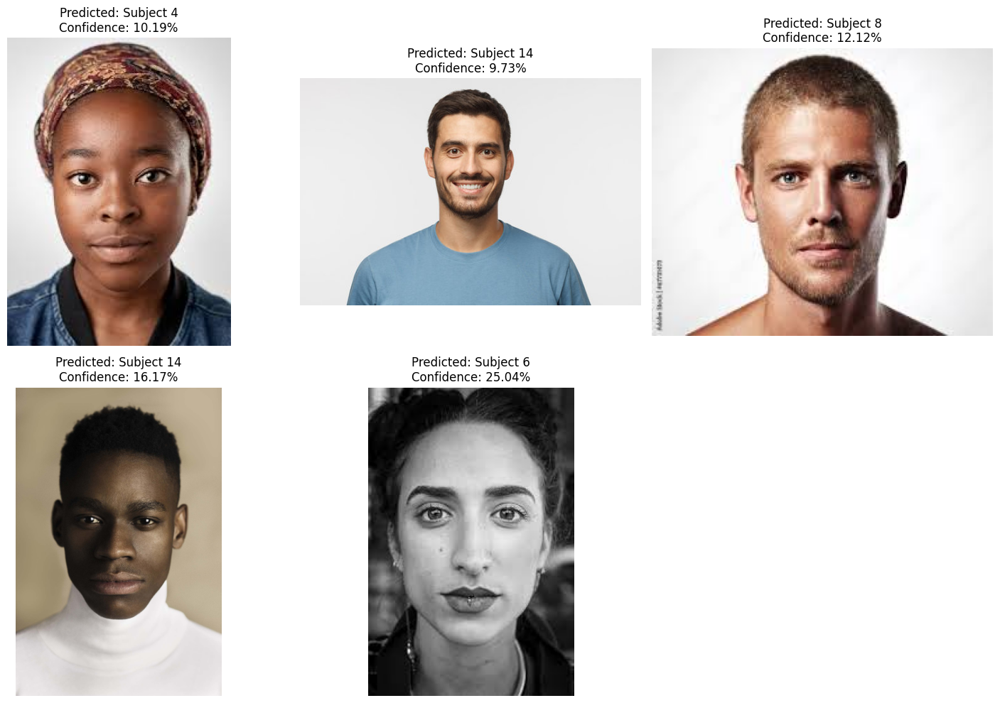

In [157]:
def predict_face(model, image_path, device):
    transform = transforms.Compose([
        transforms.Resize((150, 150)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ])
    
    image = Image.open(image_path).convert('RGB')
    original_image = image.copy()
    image = transform(image).unsqueeze(0).to(device)
    
    # Predict
    model.eval()
    with torch.no_grad():
        output = model(image)
        _, predicted = torch.max(output.data, 1)
        confidence = torch.nn.functional.softmax(output, dim=1)
        
    return predicted.item(), confidence[0][predicted.item()].item(), original_image

# Test images paths
test_images = [
    'test_images/image1.jpg',
    'test_images/image2.jpg', 
    'test_images/image3.jpg',
    'test_images/image4.jpg',
    'test_images/image5.jpg'
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for idx, img_path in enumerate(test_images):
    pred_class, confidence, img = predict_face(model, img_path, device)
    
    axes[idx].imshow(img)
    axes[idx].set_title(f'Predicted: Subject {pred_class+1}\nConfidence: {confidence*100:.2f}%')
    axes[idx].axis('off')

if len(test_images) < 6:
    fig.delaxes(axes[5])

plt.tight_layout()
plt.show()

## B.

In [2]:
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms

#train and test data directory 
data_dir = "seg_train/seg_train" 
test_data_dir = "seg_test/seg_test" 
 
 
#load the train and test data 
dataset = ImageFolder(data_dir,transform = transforms.Compose([ 
    transforms.Resize((150,150)),transforms.ToTensor() 
])) 
test_dataset = ImageFolder(test_data_dir,transforms.Compose([ 
    transforms.Resize((150,150)),transforms.ToTensor() 
]))

torch.Size([3, 150, 150]) 0
Label : buildings
Length of Train Data : 12034
Length of Validation Data : 2000


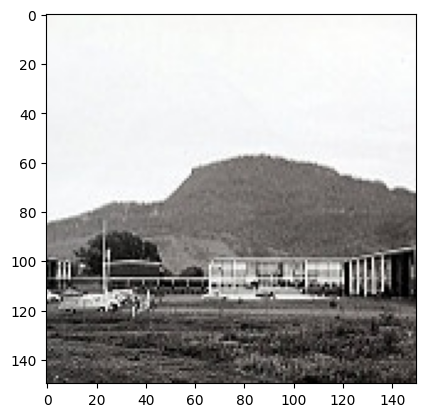

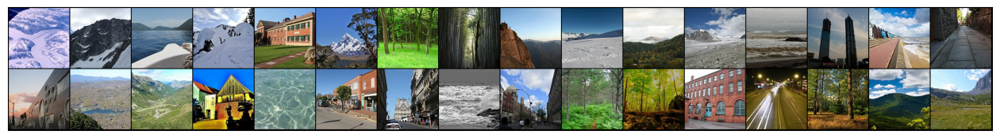

In [5]:
from torch.utils.data.dataloader import DataLoader 
from torch.utils.data import random_split 
from torchvision.utils import make_grid 
import matplotlib.pyplot as plt 
         
 
img, label = dataset[0] 
print(img.shape,label)
def display_img(img,label): 
    print(f"Label : {dataset.classes[label]}") 
    plt.imshow(img.permute(1,2,0)) 
 
def show_batch(dl): 
    """Plot images grid of single batch""" 
    for images, labels in dl: 
        fig,ax = plt.subplots(figsize = (16,12)) 
        ax.set_xticks([]) 
        ax.set_yticks([]) 
        ax.imshow(make_grid(images,nrow=16).permute(1,2,0)) 
        break 
 
#display the first image in the dataset 
display_img(*dataset[0]) 
 
# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# DataLoader setup 
batch_size = 32
val_size = 2000
train_size = len(dataset) - val_size

train_data, val_data = random_split(dataset, [train_size, val_size])
print(f"Length of Train Data : {len(train_data)}")
print(f"Length of Validation Data : {len(val_data)}")

# Modified DataLoader initialization with pin_memory=True for faster data transfer to GPU
train_dl = DataLoader(
    train_data, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=4, 
    pin_memory=True
)

val_dl = DataLoader(
    val_data, 
    batch_size=batch_size*2, 
    num_workers=4, 
    pin_memory=True
)
 
show_batch(train_dl)

In [6]:
import torch.nn as nn

class ImageClassificationBase(nn.Module): 
    def training_step(self, batch):
        images, labels = batch
        # Move batch to device
        images, labels = images.to(device), labels.to(device)
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        # Move batch to device  
        images, labels = images.to(device), labels.to(device)
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
         
    def validation_epoch_end(self, outputs): 
        batch_losses = [x['val_loss'] for x in outputs] 
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses 
        batch_accs = [x['val_acc'] for x in outputs] 
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies 
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()} 
     
    def epoch_end(self, epoch, result): 
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format( 
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [7]:
import torch.nn as nn 
import torch.nn.functional as F 
 
class NaturalSceneClassification(ImageClassificationBase): 
    def __init__(self): 
        super().__init__() 
        self.network = nn.Sequential( 
             
            nn.Conv2d(3, 32, kernel_size = 3, padding = 1), 
            nn.ReLU(), 
            nn.Conv2d(32,64, kernel_size = 3, stride = 1, padding = 1), 
            nn.ReLU(), 
            nn.MaxPool2d(2,2), 
         
            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1), 
            nn.ReLU(), 
            nn.Conv2d(128 ,128, kernel_size = 3, stride = 1, padding = 1), 
            nn.ReLU(), 
            nn.MaxPool2d(2,2), 
             
            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1), 
            nn.ReLU(),
            nn.Conv2d(256,256, kernel_size = 3, stride = 1, padding = 1), 
            nn.ReLU(), 
            nn.MaxPool2d(2,2), 
             
            nn.Flatten(), 
            nn.Linear(82944,1024), 
            nn.ReLU(), 
            nn.Linear(1024, 512), 
            nn.ReLU(), 
            nn.Linear(512,6) 
        ) 
     
    def forward(self, xb): 
        return self.network(xb)

In [8]:
def accuracy(outputs, labels): 
    _, preds = torch.max(outputs, dim=1) 
    return torch.tensor(torch.sum(preds == labels).item() / len(preds)) 
 
   
@torch.no_grad() 
def evaluate(model, val_loader): 
    model.eval() 
    outputs = [model.validation_step(batch) for batch in val_loader] 
    return model.validation_epoch_end(outputs) 
 
   
def fit(epochs, lr, model, train_loader, val_loader, opt_func = torch.optim.SGD):
    history = [] 
    optimizer = opt_func(model.parameters(),lr) 
    for epoch in range(epochs): 
         
        model.train() 
        train_losses = [] 
        for batch in train_loader: 
            loss = model.training_step(batch) 
            train_losses.append(loss) 
            loss.backward() 
            optimizer.step() 
            optimizer.zero_grad() 
             
        result = evaluate(model, val_loader) 
        result['train_loss'] = torch.stack(train_losses).mean().item() 
        model.epoch_end(epoch, result) 
        history.append(result) 
     
    return history

In [9]:
model = NaturalSceneClassification()
model = model.to(device)
num_epochs = 30 
opt_func = torch.optim.Adam 
lr = 0.001 
#fitting the model on training data and record the result after each epoch 
history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

Epoch [0], train_loss: 1.7915, val_loss: 1.7928, val_acc: 0.1738
Epoch [1], train_loss: 1.7912, val_loss: 1.7923, val_acc: 0.1724
Epoch [2], train_loss: 1.7907, val_loss: 1.7928, val_acc: 0.1724
Epoch [3], train_loss: 1.7906, val_loss: 1.7924, val_acc: 0.1724
Epoch [4], train_loss: 1.7905, val_loss: 1.7928, val_acc: 0.1724
Epoch [5], train_loss: 1.7908, val_loss: 1.7931, val_acc: 0.1724
Epoch [6], train_loss: 1.7906, val_loss: 1.7927, val_acc: 0.1724
Epoch [7], train_loss: 1.7907, val_loss: 1.7933, val_acc: 0.1724
Epoch [8], train_loss: 1.7906, val_loss: 1.7927, val_acc: 0.1724
Epoch [9], train_loss: 1.7906, val_loss: 1.7928, val_acc: 0.1724
Epoch [10], train_loss: 1.7905, val_loss: 1.7930, val_acc: 0.1724
Epoch [11], train_loss: 1.7904, val_loss: 1.7930, val_acc: 0.1724
Epoch [12], train_loss: 1.7906, val_loss: 1.7932, val_acc: 0.1724
Epoch [13], train_loss: 1.7904, val_loss: 1.7933, val_acc: 0.1724
Epoch [14], train_loss: 1.7907, val_loss: 1.7933, val_acc: 0.1724
Epoch [15], train_lo